## Business problem
  Global Mart is an online supergiant store that has worldwide operations. This store takes orders and delivers across the globe and deals with all 
the major product categories — consumer, corporate and home office.

The store dataset has 5 attributes and their data description is as given below:
 
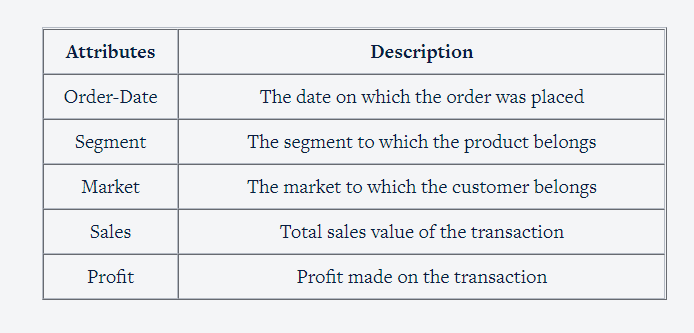
 

If you check the entries in the dataset, you will see that the store caters to 7 different geographical market segments and 3 major customer segments, i.e. consumer, corporate and home as can be seen in the table below.

 
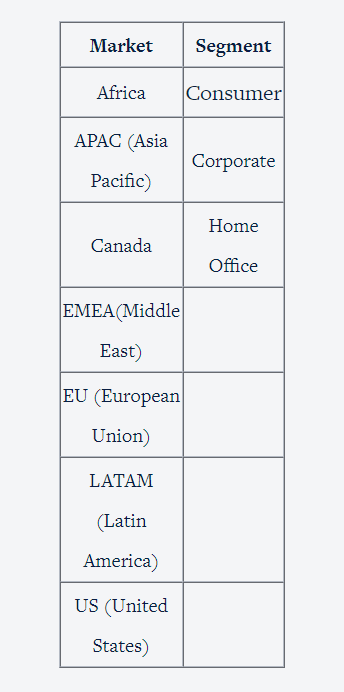 
 

 

Based on these, there are 21 unique "Market-Segments" for which the sales forecasts can be made. That is the dataset needs to be prepared such that you get the Order-Date, Sales and Profit for the 21 market segments.

 

Now, due to certain unpredictable circumstances in the market, as a company, you are prioritizing only the best and most consistent market segment in terms of profitability. You want to see which market segment is the most consistently profitable. And then, you want to forecast the sales for that most consistently profitable market-segment only. This way you know that the market region your company is investing in will be beneficial for the company as the forecasts will be reliable. As of now, you do not want to focus on other market segments that might have not been very consistent and profitable to your company.

 

So, not all of these 21 market segments are important from the store’s point of view. You need to find out the most consistently profitable market-segment from the above and forecast the sales and demand for that single market-segment only and not for all.

 

Now the question is how do you find that most profitable market segment from the 21 market segments?
 

## How to find the most profitable market segment?
By now, it’s clear that you only need to work on one market-segment which is the most consistently profitable. To find the most consistently profitable market-segment you will be using a measure called "Coefficient of Variation (CoV)". The coefficient of variation or CoV is nothing but the ratio of the standard deviation to mean for the data that it is being calculated for.

 

But why consider the coefficient of variation here and not the standard deviation for measuring how much variation is present in the data for each of the 21 market segments? and how will the coefficient of variation lead you to the most profitable market segment for which eventually you will want to forecast the sales?

 

The coefficient of variation is a ratio of the standard deviation to mean. Once you have prepared the data such that you have the Order-Date, Sales and Profit against each of the 21 market segments, and not in the manner as it was in the initial dataset, you can check the standard deviation and the mean calculated on profit for all the 21 market segments and compare. You will find that these values vary a lot and hence it is meaningless to compare the 21 market segment's profits based on the standard deviation and their mean.

 

Actually, standard deviations are meaningless to compare different datasets as you would see for these 21 market-segments as well. As a better metric to compare the variance between the segments you use the coefficient of variation which will normalise the standard deviation with the mean and give you a comparative figure on the basis of which you can identify the most profitable market segment.

 

As a part of this assignment, you will find the coefficient of variations for all these 21 market segments and list them in a table and compare them.

 

Now, it is for you to reason out whether the most profitable market segment should have the least value of CoV or the highest value of CoV. However, please note that as a Sales manager you want to forecast the sales where the market segment is reliable or in other words, there is less variation in the profits.
 

The steps For doing the data preparation as mentioned —

##### 1.Find the 21 unique Market Segments by combining the respective 7 geographical markets for each of 3 segments such as Home office, Consumer and Corporate.
##### 2.Your dataset after the above step should have Order-Date, Sales, Profit against each market segment such as APAC-Consumer, APAC-Home Office and so on.
##### 3.Once you have understood the dataset of the global data store, you need to get the order date in the required month-year format to make it a monthly aggregated transaction data. For this, convert the order-date into a date-time format for getting it into the Month-year format; you will get the data for 48 months now.
##### 4.After the above step, perform the train-test split such that you take the 42 months as the train data and the 6 months as the test data.
##### 5.Calculate the CoV on the profit for each of the 21 market segments on the train data.
##### 6.Find the most profitable market segment by comparing the 21 CoV values.

In [1]:
# syntax for filtering warnings

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Importing the required liberarys like numpy and pandas

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  #  Note: importing a new hvplot liberary for visualization 
import hvplot.pandas
%matplotlib inline

In [5]:
# read csv

In [6]:
df=pd.read_csv("Global+Superstore+Data.csv")
df.head()

,Order Date,Segment,Market,Sales,Profit
0,31-07-2012,Consumer,US,2309.650,762.1845
1,05-02-2013,Corporate,APAC,3709.395,-288.7650
2,17-10-2013,Consumer,APAC,5175.171,919.9710
3,28-01-2013,Home Office,EU,2892.510,-96.5400
4,05-11-2013,Consumer,Africa,2832.960,311.5200


In [7]:
print("there are {} columns and {} rows in the dataset".format(df.shape[1],df.shape[0]))

there are 5 columns and 51290 rows in the dataset


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Order Date  51290 non-null  object 
 1   Segment     51290 non-null  object 
 2   Market      51290 non-null  object 
 3   Sales       51290 non-null  float64
 4   Profit      51290 non-null  float64
dtypes: float64(2), object(3)
memory usage: 2.0+ MB


In [9]:
df.describe()

,Sales,Profit
count,51290.000000,51290.000000
mean,246.490581,28.610982
std,487.565361,174.340972
min,0.444000,-6599.978000
25%,30.758625,0.000000
50%,85.053000,9.240000
75%,251.053200,36.810000
max,22638.480000,8399.976000


## Data Preparation and EDA

In [10]:
df.head()

,Order Date,Segment,Market,Sales,Profit
0,31-07-2012,Consumer,US,2309.650,762.1845
1,05-02-2013,Corporate,APAC,3709.395,-288.7650
2,17-10-2013,Consumer,APAC,5175.171,919.9710
3,28-01-2013,Home Office,EU,2892.510,-96.5400
4,05-11-2013,Consumer,Africa,2832.960,311.5200


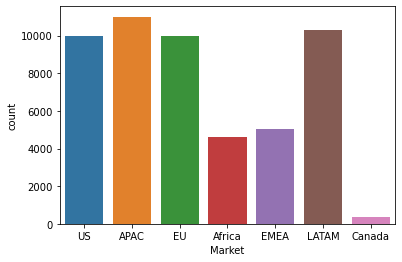

In [11]:
sns.countplot(x="Market",data=df)
plt.show()

###### Markdown: APAC segments has the highest numbers of transactions

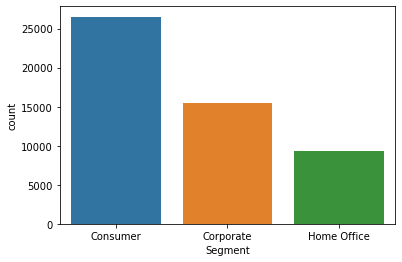

In [12]:
sns.countplot(x="Segment",data=df)
plt.show()

###### Markdown: Consumer segments has the highest numbers of transactions

In [13]:
# Combining Market and Segment

##### 1.Finding the 21 unique Market Segments by combining the respective 7 geographical markets for each of 3 segments.

In [14]:
df['Market_Segment']= df['Market']+'-'+df['Segment']
df.head()

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


,Order Date,Segment,Market,Sales,Profit,Market_Segment
0,31-07-2012,Consumer,US,2309.650,762.1845,US-Consumer
1,05-02-2013,Corporate,APAC,3709.395,-288.7650,APAC-Corporate
2,17-10-2013,Consumer,APAC,5175.171,919.9710,APAC-Consumer
3,28-01-2013,Home Office,EU,2892.510,-96.5400,EU-Home Office
4,05-11-2013,Consumer,Africa,2832.960,311.5200,Africa-Consumer


In [15]:
df.drop(["Segment","Market"],axis=1,inplace=True)
df.head()

,Order Date,Sales,Profit,Market_Segment
0,31-07-2012,2309.650,762.1845,US-Consumer
1,05-02-2013,3709.395,-288.7650,APAC-Corporate
2,17-10-2013,5175.171,919.9710,APAC-Consumer
3,28-01-2013,2892.510,-96.5400,EU-Home Office
4,05-11-2013,2832.960,311.5200,Africa-Consumer


In [16]:
df.hvplot(title="data summery") # comparing sales and profit variable

:NdOverlay   [Variable]
   :Curve   [index]   (value)

##### 2.the dataset after the above step should have Order-Date, Sales, Profit against each market segment such as APAC-Consumer, APAC-Home Office and so on.

In [17]:
df.Market_Segment.value_counts()

APAC-Consumer         5699
LATAM-Consumer        5321
US-Consumer           5191
EU-Consumer           5186
APAC-Corporate        3283
EU-Corporate          3077
LATAM-Corporate       3053
US-Corporate          3020
EMEA-Consumer         2538
Africa-Consumer       2381
APAC-Home Office      2020
LATAM-Home Office     1920
US-Home Office        1783
EU-Home Office        1737
EMEA-Corporate        1574
Africa-Corporate      1312
EMEA-Home Office       917
Africa-Home Office     894
Canada-Consumer        202
Canada-Corporate       110
Canada-Home Office      72
Name: Market_Segment, dtype: int64

In [18]:
### Markdown: there will be 21 segmets in the market when we combine both market and segments and "APAC-Consumer" has the highest number of Orders and "Canada-Home Office" has lowest numbers of orders in this collected sheet

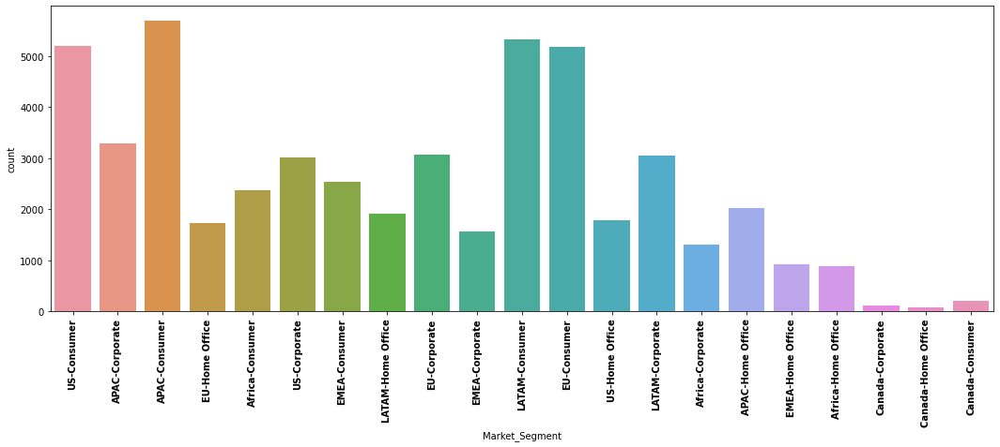

In [19]:
plt.figure(figsize=(18,6))
sns.countplot(x="Market_Segment",data=df)
plt.xticks(rotation = 90,fontweight="bold")
plt.show()

In [20]:
df.hvplot.barh("Market_Segment","Sales",height=400)

:Bars   [Market_Segment]   (Sales)

Markdown: Canada-Consumer has the lowest Sales and US-Home Office segment has highest sales in the provided period of dataset

In [21]:
df.hvplot.barh("Market_Segment","Profit",height=400)

:Bars   [Market_Segment]   (Profit)

US-Consumer is marking the most loss and US-Corporate marked the highest Profit

## Convert the order-date into a date-time format

##### 3.Once we have understood the dataset of the global data store, we need to get the order date in the required month-year format to make it a monthly aggregated transaction data.  

In [22]:
df['Order Date'] = pd.to_datetime(df['Order Date']).dt.to_period('m')
df= df.sort_values(by=['Order Date'])

In [23]:
df.head()

,Order Date,Sales,Profit,Market_Segment
15262,2011-01,139.65,15.30,EU-Corporate
26744,2011-01,88.44,15.84,EU-Consumer
48614,2011-01,11.43,4.11,EU-Corporate
9417,2011-01,491.00,122.70,LATAM-Consumer
48590,2011-01,4.71,0.00,US-Home Office


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51290 entries, 15262 to 541
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype    
---  ------          --------------  -----    
 0   Order Date      51290 non-null  period[M]
 1   Sales           51290 non-null  float64  
 2   Profit          51290 non-null  float64  
 3   Market_Segment  51290 non-null  object   
dtypes: float64(2), object(1), period[M](1)
memory usage: 2.0+ MB


# Aggregate data as per month

In [25]:
profit_data=df.pivot_table(index='Order Date',columns='Market_Segment',aggfunc='sum',values='Profit')
profit_data.head()

Market_Segment,APAC-Consumer,APAC-Corporate,APAC-Home Office,Africa-Consumer,Africa-Corporate,Africa-Home Office,Canada-Consumer,Canada-Corporate,Canada-Home Office,EMEA-Consumer,...,EMEA-Home Office,EU-Consumer,EU-Corporate,EU-Home Office,LATAM-Consumer,LATAM-Corporate,LATAM-Home Office,US-Consumer,US-Corporate,US-Home Office
Order Date,,,,,,,,,,,,,,,,,,,,,
2011-01,2254.4898,-173.7264,230.2656,265.539,520.026,391.515,447.33,12.57,NaN,-2952.594,...,392.526,2259.8670,841.3875,2534.568,540.44312,1021.05924,-26.59744,2465.8368,643.3689,1233.9329
2011-02,4627.8531,3600.7776,617.5407,-201.888,-31.689,825.606,26.43,9.24,87.99,464.160,...,368.070,-783.9945,2234.4060,162.255,1227.86616,814.03020,-356.80440,1853.5541,421.9256,553.9467
2011-03,2337.8319,3634.9365,205.1052,919.074,244.437,83.430,82.47,NaN,84.03,706.380,...,-15.570,1273.7100,2206.5960,269.745,2427.39612,178.66400,769.88400,204.2007,127.4696,-268.9314
2011-04,633.6423,90.7521,603.8478,381.315,941.751,417.618,55.08,6.51,NaN,121.353,...,-456.510,2980.0065,981.1470,130.371,1368.82948,872.64068,-554.22952,1434.8636,494.7315,2723.4358
2011-05,3838.9500,1028.4489,102.0315,-39.981,490.650,39.180,0.87,NaN,NaN,172.554,...,-33.591,673.0080,1719.0600,443.310,1749.39200,134.87252,-397.95600,833.9433,2912.7976,145.7781


In [26]:
profit_data.shape

(48, 21)

##### 4. performing the train-test split such that you take the 42 months as the train data and the 6 months as the test data.

In [27]:
train_len = 42
train = profit_data[0:train_len]
test = profit_data[train_len:]

In [28]:
print("shape of train data{} and test data{}".format(train.shape,test.shape))

shape of train data(42, 21) and test data(6, 21)


In [29]:
train.head()

Market_Segment,APAC-Consumer,APAC-Corporate,APAC-Home Office,Africa-Consumer,Africa-Corporate,Africa-Home Office,Canada-Consumer,Canada-Corporate,Canada-Home Office,EMEA-Consumer,...,EMEA-Home Office,EU-Consumer,EU-Corporate,EU-Home Office,LATAM-Consumer,LATAM-Corporate,LATAM-Home Office,US-Consumer,US-Corporate,US-Home Office
Order Date,,,,,,,,,,,,,,,,,,,,,
2011-01,2254.4898,-173.7264,230.2656,265.539,520.026,391.515,447.33,12.57,NaN,-2952.594,...,392.526,2259.8670,841.3875,2534.568,540.44312,1021.05924,-26.59744,2465.8368,643.3689,1233.9329
2011-02,4627.8531,3600.7776,617.5407,-201.888,-31.689,825.606,26.43,9.24,87.99,464.160,...,368.070,-783.9945,2234.4060,162.255,1227.86616,814.03020,-356.80440,1853.5541,421.9256,553.9467
2011-03,2337.8319,3634.9365,205.1052,919.074,244.437,83.430,82.47,NaN,84.03,706.380,...,-15.570,1273.7100,2206.5960,269.745,2427.39612,178.66400,769.88400,204.2007,127.4696,-268.9314
2011-04,633.6423,90.7521,603.8478,381.315,941.751,417.618,55.08,6.51,NaN,121.353,...,-456.510,2980.0065,981.1470,130.371,1368.82948,872.64068,-554.22952,1434.8636,494.7315,2723.4358
2011-05,3838.9500,1028.4489,102.0315,-39.981,490.650,39.180,0.87,NaN,NaN,172.554,...,-33.591,673.0080,1719.0600,443.310,1749.39200,134.87252,-397.95600,833.9433,2912.7976,145.7781


## Calculate the CoV

##### 5. CoV on the profit for each of the 21 market segments on the train data.

In [30]:
mean=np.mean(train)
std= np.std(train)

CoV_df= pd.DataFrame(mean)
CoV_df['std']= std
CoV_df['CoV'] = std/mean
CoV_df= CoV_df.reset_index()
CoV_df.columns= ['Market_Segment','Mean', 'Std', 'CoV']
CoV_df.sort_values(by='CoV', ascending= True, inplace = True)
CoV_df

,Market_Segment,Mean,Std,CoV
0,APAC-Consumer,4400.894243,2300.457687,0.522725
1,APAC-Corporate,2574.919807,1364.837734,0.530051
12,EU-Consumer,3699.977143,2202.282289,0.595215
15,LATAM-Consumer,2295.555697,1569.632686,0.683770
13,EU-Corporate,2216.299429,1600.336696,0.722076
16,LATAM-Corporate,1122.633016,990.360880,0.882177
14,EU-Home Office,1224.456536,1148.627937,0.938072
2,APAC-Home Office,1511.088314,1523.508658,1.008219
18,US-Consumer,2686.740912,2715.031412,1.010530
19,US-Corporate,1754.199083,1880.200775,1.071829


In [31]:
Lowest_CoV_value =min(CoV_df["CoV"])
Lowest_CoV_value

0.5227250555218101

In [32]:
CoV_df.hvplot.barh(x='Market_Segment', y= 'CoV',)

:Bars   [Market_Segment]   (CoV)

## Convert Order-Date from "DateTime" to "timestamp"

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51290 entries, 15262 to 541
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype    
---  ------          --------------  -----    
 0   Order Date      51290 non-null  period[M]
 1   Sales           51290 non-null  float64  
 2   Profit          51290 non-null  float64  
 3   Market_Segment  51290 non-null  object   
dtypes: float64(2), object(1), period[M](1)
memory usage: 2.0+ MB


In [34]:
df["Order Date"].dtype

period[M]

In [35]:
df["Order Date"]=df["Order Date"].astype(str)

In [36]:
df["Order Date"]=pd.to_datetime(df["Order Date"])

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51290 entries, 15262 to 541
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Order Date      51290 non-null  datetime64[ns]
 1   Sales           51290 non-null  float64       
 2   Profit          51290 non-null  float64       
 3   Market_Segment  51290 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 2.0+ MB


###### the Order Date column is converted from period to DateTime 

## Taking the most consistently profitable Segment and drop the rest

In [38]:
main_df= df[(df.Market_Segment=='APAC-Consumer')]
main_df.head()

,Order Date,Sales,Profit,Market_Segment
1080,2011-01-01,1429.050,371.490,APAC-Consumer
9203,2011-01-01,219.780,59.340,APAC-Consumer
19331,2011-01-01,342.510,54.600,APAC-Consumer
26270,2011-01-01,102.762,1.842,APAC-Consumer
14830,2011-01-01,420.420,147.000,APAC-Consumer


In [39]:
main_df.shape

(5699, 4)

## Grouped the dataset based on Order Date and Sales

In [40]:
df1=main_df.groupby('Order Date')
df1=pd.DataFrame(df1['Sales'].sum())
df1.head()


,Sales
Order Date,
2011-01-01,18821.9898
2011-02-01,23313.3531
2011-03-01,26518.4919
2011-04-01,12046.0923
2011-05-01,25941.9000


In [41]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 48 entries, 2011-01-01 to 2014-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Sales   48 non-null     float64
dtypes: float64(1)
memory usage: 768.0 bytes


In [42]:
df1.describe()

,Sales
count,48.000000
mean,37849.035425
std,14671.281955
min,12046.092300
25%,26209.485300
50%,36578.300400
75%,48088.354575
max,79834.429500


## Now applying Time Series Analysis

In [43]:
df1.hvplot.line(x='Order Date',y="Sales",title="Retail Giant Sales")

:Curve   [Order Date]   (Sales)

In [44]:
## Checking Null Values

In [45]:
df1.isnull().sum()

Sales    0
dtype: int64

## Train-Test Split

In [46]:
data=42
train=df1[0:data]
test=df1[data:]

In [47]:
print(train.shape,test.shape)

(42, 1) (6, 1)


In [48]:
# so 42 train sets and 6 test sets

## Time series Decomposition

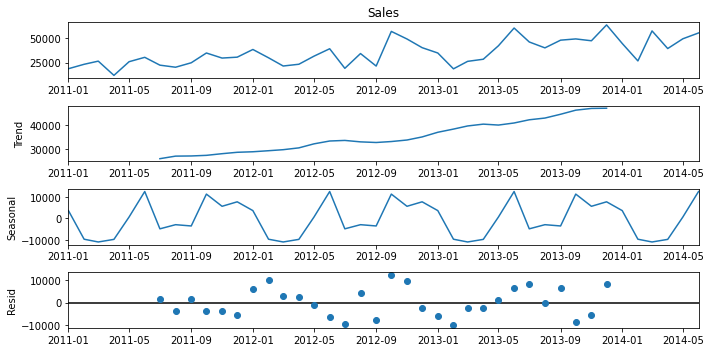

In [49]:
# Additive
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 10, 5
decomposition = sm.tsa.seasonal_decompose(train.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

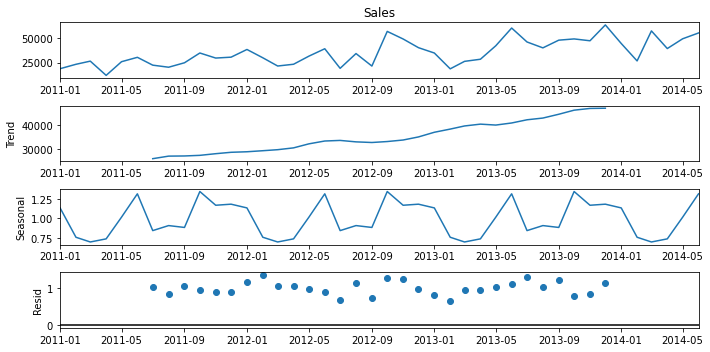

In [50]:
#multiplicative
rcParams['figure.figsize'] = 10, 5
decomposition = sm.tsa.seasonal_decompose(train.Sales, model='multiplicative') # additive seasonal index
fig = decomposition.plot()
plt.show()

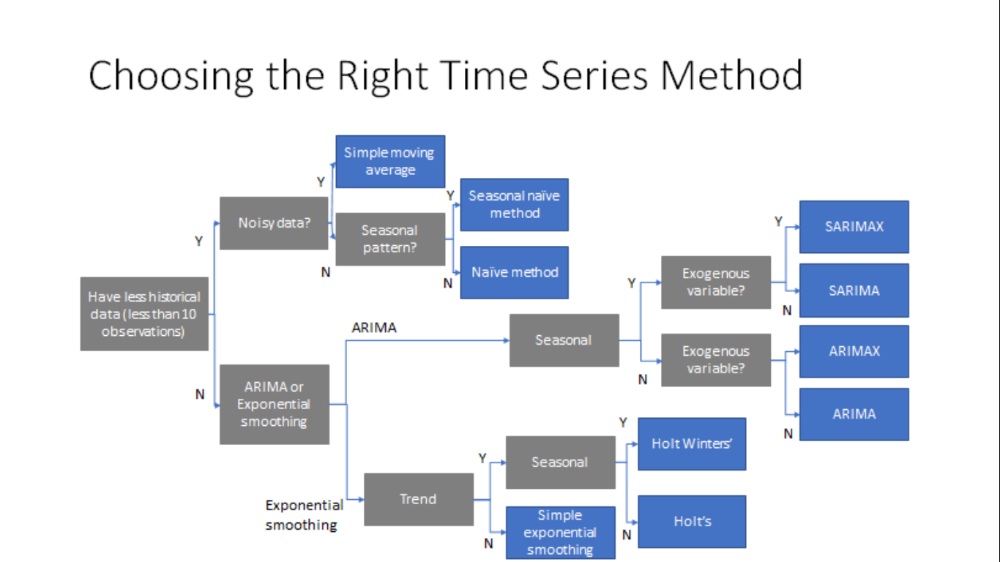!

##  Build and evaluate time series forecast

In [51]:
train_len = 42
train = df1[0:train_len] 
test = df1[train_len:]

In [52]:
# Naive Method: Naive forecasting is the technique in which the last sales are used for the next forecast.

In [53]:
y_naive=test.copy()
y_naive["forcast"]=train.Sales[-1]
y_naive.head()

,Sales,forcast
Order Date,,
2014-07-01,43672.0749,55151.4699
2014-08-01,48848.3409,55151.4699
2014-09-01,45424.3119,55151.4699
2014-10-01,61221.9792,55151.4699
2014-11-01,79834.4295,55151.4699


In [54]:
 def Plot(x,y):
        plt.figure(figsize=(12,4))
        plt.plot(train.Sales,label="Train")
        plt.plot(test.Sales,label="Test")
        plt.plot(x,label="Forcast")
        plt.xlabel("Order Date")
        plt.ylabel("Sales")
        plt.title(y)
        plt.legend(loc="best")
        plt.show()


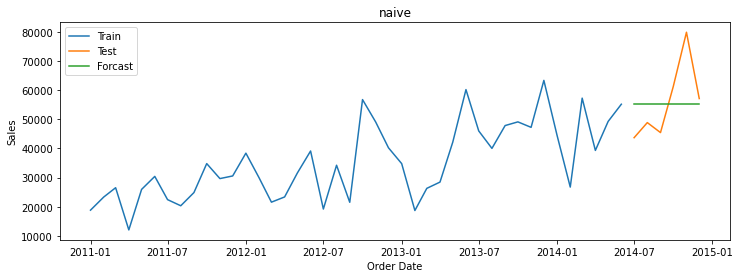

In [55]:
Plot(y_naive["forcast"],"naive")

In [56]:
# Now Calculating RMSC and MAPE

Mean Absolute Percentage Error (MAPE):


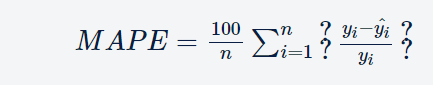

Root Mean Squared Error (RMSE):

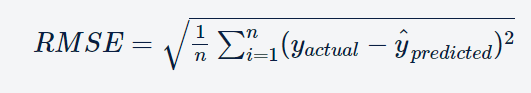

In [57]:
from sklearn.metrics import mean_squared_error
def Error(n,x):
    RMSE=round(np.sqrt(mean_squared_error(test["Sales"],n)),2)
    MAPE=round(np.mean(np.abs(test["Sales"]-n)/test["Sales"])*100,2)
    r=pd.DataFrame({"Method":[x],"RMSE":[RMSE],"MAPE":[MAPE]})
    return(r)
    

In [58]:
a=Error(y_naive["forcast"],"naive")
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47


In [59]:
# Simple average method

In [60]:
y_savg=test.copy()
y_savg['forcast1'] = train.Sales.mean()

y_savg.head()

,Sales,forcast1
Order Date,,
2014-07-01,43672.0749,35253.632814
2014-08-01,48848.3409,35253.632814
2014-09-01,45424.3119,35253.632814
2014-10-01,61221.9792,35253.632814
2014-11-01,79834.4295,35253.632814


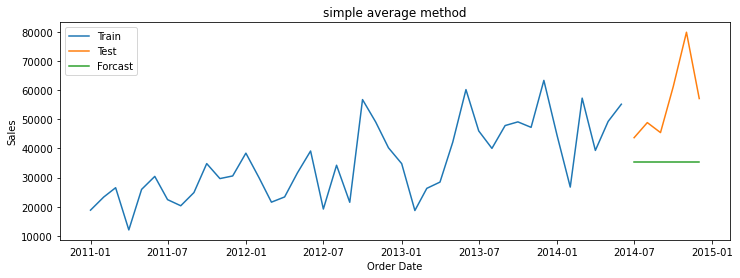

In [61]:
Plot(y_savg['forcast1'],"simple average method")

In [62]:
b=Error(y_savg['forcast1'],"simple average method")
b

,Method,RMSE,MAPE
0,simple average method,24146.06,34.34


In [63]:
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34


In [64]:
# Simple moving average method

In [65]:
y_sma = df1.copy()
window = 3 
y_sma['sma_forecast'] = df1['Sales'].rolling(window).mean()
y_sma['sma_forecast'][train_len:] = y_sma['sma_forecast'][train_len-1]
y_sma.head()

,Sales,sma_forecast
Order Date,,
2011-01-01,18821.9898,NaN
2011-02-01,23313.3531,NaN
2011-03-01,26518.4919,22884.6116
2011-04-01,12046.0923,20625.9791
2011-05-01,25941.9000,21502.1614


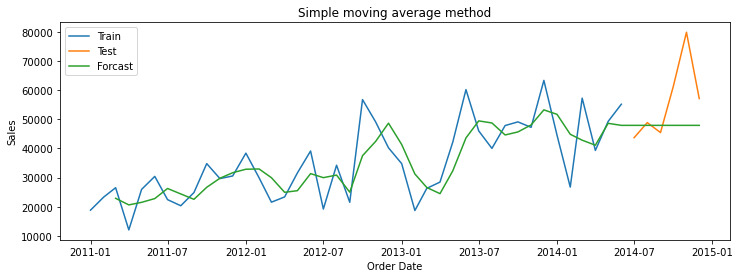

In [66]:
Plot(y_sma['sma_forecast'],"Simple moving average method")

In [67]:
b=Error(y_sma['sma_forecast'][train_len:],"Simple moving average method")
b

,Method,RMSE,MAPE
0,Simple moving average method,14756.73,15.82


In [68]:
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82


## Exponential Smoothing Method

In [69]:
#Simple exponential smoothing

In [70]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
model = SimpleExpSmoothing(train['Sales'])
model_fit = model.fit(optimized=True)
model_fit.params
y_ses = test.copy()
y_ses['forecast'] = model_fit.forecast(6)

C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


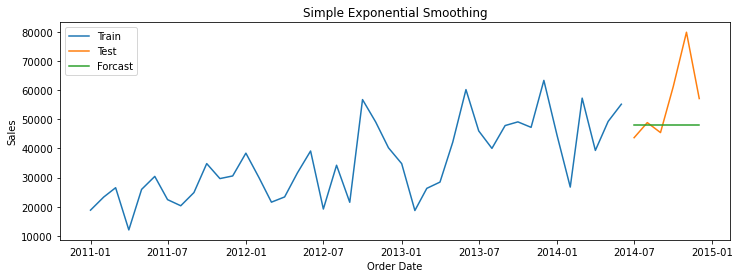

In [71]:
Plot(y_ses['forecast'],"Simple Exponential Smoothing")

In [72]:
b=Error(y_ses['forecast'],"Simple Exponential Smoothing")
b

,Method,RMSE,MAPE
0,Simple Exponential Smoothing,14627.34,15.74


In [73]:
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74


In [74]:
# Holt's Exponential Smoothing

In [75]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
model = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=12 ,trend='additive', seasonal=None)
model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)
print(model_fit.params)
y_holt = test.copy()
y_holt['forecast'] = model_fit.forecast(len(test))

{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 18821.989799999996, 'initial_trend': 4491.3633000000045, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


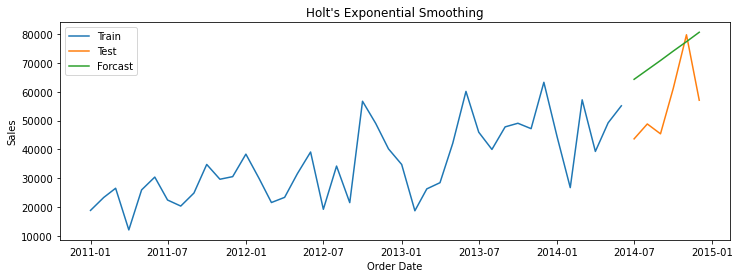

In [76]:
Plot(y_holt['forecast'],"Holt\'s Exponential Smoothing")

In [77]:
b=Error(y_holt['forecast'],"Holt\'s Exponential Smoothing")
b

,Method,RMSE,MAPE
0,Holt's Exponential Smoothing,18976.37,34.57


In [78]:
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57


In [79]:
# Holt Winters' additive method with trend and seasonality

In [80]:
y_hwa = test.copy()
model = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=12 ,trend='add', seasonal='add')
model_fit = model.fit(optimized=True)
print(model_fit.params)
y_hwa['forecast'] = model_fit.forecast(6)

{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.010816326530612248, 'smoothing_seasonal': 0.1026984126984127, 'damping_trend': nan, 'initial_level': 34110.965325, 'initial_trend': 730.4167145833331, 'initial_seasons': array([-15288.975525, -10797.612225,  -7592.473425, -22064.873025,
        -8169.065325,  -3712.033725, -11679.370425, -13779.891825,
        -9250.570425,    676.322775,  -4462.610625,  -3556.103925]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


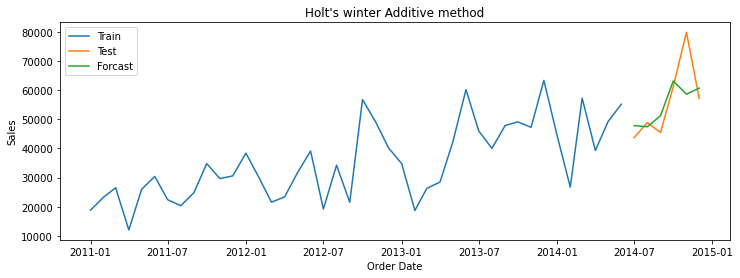

In [81]:
Plot(y_hwa['forecast'],"Holt\'s winter Additive method")

In [82]:
b=Error(y_hwa['forecast'],"Holt\'s winter Additive method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17


In [83]:
# Holt Winter's multiplicative method 
y_hwm = test.copy()
model = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=12 ,trend='add', seasonal='mul')
model_fit = model.fit(optimized=True)
print(model_fit.params)
y_hwm['forecast'] = model_fit.forecast(6)

{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.0001, 'smoothing_seasonal': 0.13709183673469388, 'damping_trend': nan, 'initial_level': 34110.965325, 'initial_trend': 730.4167145833331, 'initial_seasons': array([0.55178708, 0.68345627, 0.77741839, 0.35314428, 0.76051498,
       0.8911777 , 0.65760657, 0.5960275 , 0.72880948, 1.01982714,
       0.86917372, 0.89574895]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


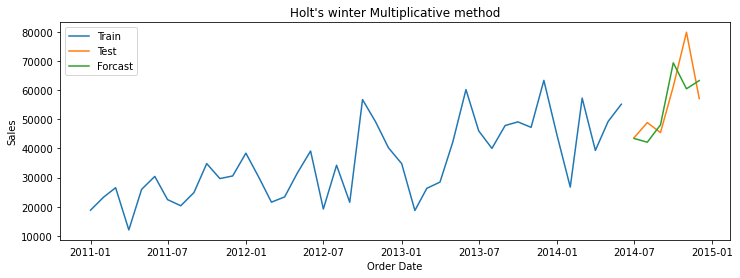

In [84]:
Plot(y_hwm['forecast'],"Holt\'s winter Multiplicative method")

In [85]:
b=Error(y_hwm['forecast'],"Holt\'s winter Multiplicative method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43


## Auto Regressive methods

In [86]:
df1.hvplot.line(x='Order Date',y="Sales",title="Retail Giant Sales")

:Curve   [Order Date]   (Sales)

In [87]:
# Augmented Dickey-Fuller (ADF) test:

In [88]:
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(df1['Sales'])
adf_test

(-3.3760244736258036,
 0.011803859657119728,
 0,
 47,
 {'1%': -3.5778480370438146,
  '5%': -2.925338105429433,
  '10%': -2.6007735310095064},
 804.80930070885)

In [89]:
print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -3.376024
Critical Values @ 0.05: -2.93
p-value: 0.011804


In [90]:
# P-value<0.05 so Series is Stationary and Rejects Null Hypothesis

In [91]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [92]:
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(df1['Sales'])
kpss_test

(0.5770764651955993,
 0.024720321345854605,
 10,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

In [93]:
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.577076
Critical Values @ 0.05: 0.46
p-value: 0.024720


In [94]:
# P-value<0.05 so Series is not Stationary

markdown: the time series is not stationary.To make it stationary we will use Box-cox transformation to make the variance constant and use first order differencing to make the mean constant.

## Box Cox transformation to make variance constant

In [95]:
from scipy.stats import boxcox
data_boxcox = pd.Series(boxcox(df1.Sales, lmbda=0), index = df1.index)

In [96]:
data_boxcox.hvplot(label='After Box Cox tranformation')

:Curve   [Order Date]   (0)

## Differencing to remove trend

In [97]:
data_boxcox_diff = pd.Series(data_boxcox - data_boxcox.shift(), df1.index)

In [98]:
data_boxcox_diff.hvplot(label='After Box Cox transform and differencing')

:Curve   [Order Date]   (0)

In [99]:
data_boxcox_diff.dropna(inplace=True)

In [100]:
data_boxcox_diff.tail()

Order Date
2014-08-01    0.112012
2014-09-01   -0.072673
2014-10-01    0.298459
2014-11-01    0.265449
2014-12-01   -0.335151
dtype: float64

In [101]:
#Augmented Dickey-Fuller (ADF) test

In [102]:
adf_test = adfuller(data_boxcox_diff)
adf_test

(-4.535011324054353,
 0.0001698967632114405,
 10,
 36,
 {'1%': -3.626651907578875,
  '5%': -2.9459512825788754,
  '10%': -2.6116707716049383},
 20.421044121623893)

In [103]:
print('ADF Statistic: %f' % adf_test[0])
print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Statistic: -4.535011
Critical Values @ 0.05: -2.95
p-value: 0.000170


In [104]:
#The series is stationary

In [105]:
#Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [106]:
kpss_test = kpss(data_boxcox_diff)
kpss_test

C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1910: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


(0.1564557744174813,
 0.1,
 10,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

In [107]:
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS Statistic: 0.156456
Critical Values @ 0.05: 0.46
p-value: 0.100000


In [108]:
# p-value is 0.100 >= 0.05, Fail to reject the null hypothesis
#so Stationary

##### Using the stationary test we can convert non stationary to stationary series to build Auto-Regressive Model

## Autocorrelation function (ACF)

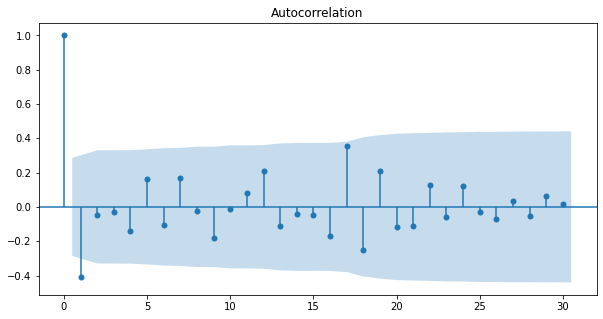

In [109]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(data_boxcox_diff, ax=plt.gca(), lags = 30)
plt.show()

## Partial autocorrelation function (PACF)

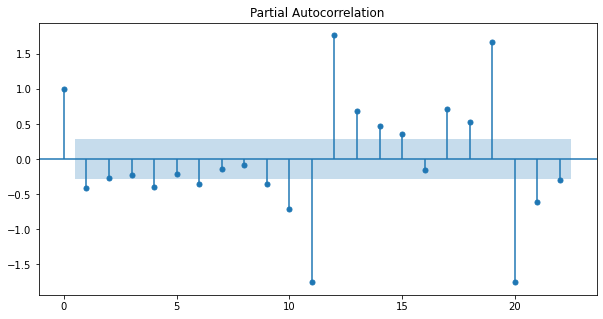

In [110]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(data_boxcox_diff, ax=plt.gca(), lags = 22)
plt.show()

In [111]:
train_data_boxcox = data_boxcox[:train_len]
test_data_boxcox = data_boxcox[train_len:]
train_data_boxcox_diff = data_boxcox_diff[:train_len-1]
test_data_boxcox_diff = data_boxcox_diff[train_len-1:]

In [112]:
train_data_boxcox_diff

Order Date
2011-02-01    0.214000
2011-03-01    0.128816
2011-04-01   -0.789102
2011-05-01    0.767119
2011-06-01    0.158548
2011-07-01   -0.303937
2011-08-01   -0.098320
2011-09-01    0.201126
2011-10-01    0.335976
2011-11-01   -0.159845
2011-12-01    0.030117
2012-01-01    0.227734
2012-02-01   -0.248683
2012-03-01   -0.327663
2012-04-01    0.079944
2012-05-01    0.301872
2012-06-01    0.213622
2012-07-01   -0.710884
2012-08-01    0.577494
2012-09-01   -0.463894
2012-10-01    0.969434
2012-11-01   -0.146063
2012-12-01   -0.198531
2013-01-01   -0.144942
2013-02-01   -0.620558
2013-03-01    0.341112
2013-04-01    0.078691
2013-05-01    0.392955
2013-06-01    0.355907
2013-07-01   -0.268628
2013-08-01   -0.139388
2013-09-01    0.178702
2013-10-01    0.026014
2013-11-01   -0.038982
2013-12-01    0.293485
2014-01-01   -0.353341
2014-02-01   -0.508883
2014-03-01    0.761118
2014-04-01   -0.375717
2014-05-01    0.225410
2014-06-01    0.113222
dtype: float64

## Auto regression method (AR)

In [113]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(train_data_boxcox_diff, order=(1, 0, 0)) 
model_fit = model.fit()
print(model_fit.params)

const      0.024255
ar.L1.y   -0.406729
dtype: float64


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [114]:
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(data_boxcox[0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

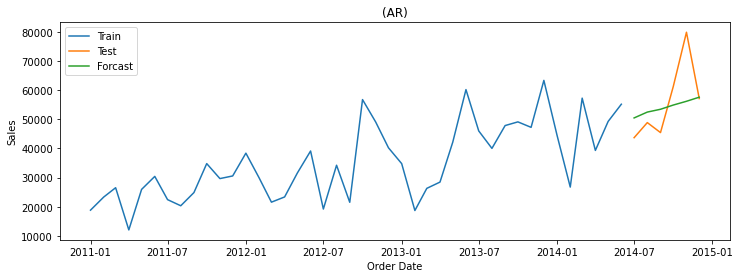

In [115]:
Plot(y_hat_ar['ar_forecast'][test.index.min():],"(AR)")

In [116]:
b=Error(y_hat_ar['ar_forecast'][test.index.min():],"Autoregressive (AR) method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43
0,Autoregressive (AR) method,10985.28,13.56


## Moving average method (MA)

In [117]:
model = ARIMA(train_data_boxcox_diff, order=(0, 0, 1)) 
model_fit = model.fit()
print(model_fit.params)

const      0.021415
ma.L1.y   -1.000000
dtype: float64


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [118]:
y_hat_ma = data_boxcox_diff.copy()
y_hat_ma['ma_forecast_boxcox_diff'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_ma['ma_forecast_boxcox'] = y_hat_ma['ma_forecast_boxcox_diff'].cumsum()
y_hat_ma['ma_forecast_boxcox'] = y_hat_ma['ma_forecast_boxcox'].add(data_boxcox[0])
y_hat_ma['ma_forecast'] = np.exp(y_hat_ma['ma_forecast_boxcox'])

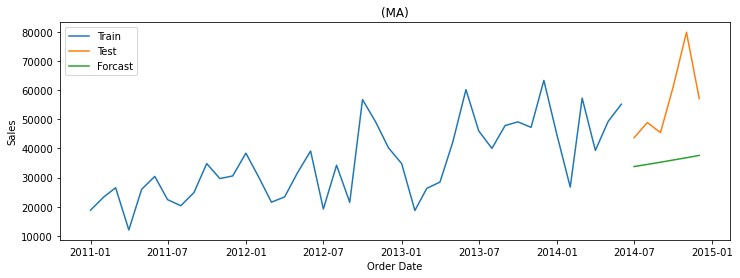

In [119]:
Plot(y_hat_ma['ma_forecast'][test.index.min():],"(MA)")

In [120]:
b=Error(y_hat_ma['ma_forecast'][test.index.min():],"Moving Average (MA) method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43
0,Autoregressive (AR) method,10985.28,13.56
0,Moving Average (MA) method,23360.02,33.93


## Auto regression moving average method (ARMA)

In [121]:
model = ARIMA(train_data_boxcox_diff, order=(1, 0, 1))
model_fit = model.fit()
print(model_fit.params)

const      0.02147
ar.L1.y    0.07458
ma.L1.y   -1.00000
dtype: float64


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [122]:
y_hat_arma = data_boxcox_diff.copy()
y_hat_arma['arma_forecast_boxcox_diff'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_arma['arma_forecast_boxcox'] = y_hat_arma['arma_forecast_boxcox_diff'].cumsum()
y_hat_arma['arma_forecast_boxcox'] = y_hat_arma['arma_forecast_boxcox'].add(data_boxcox[0])
y_hat_arma['arma_forecast'] = np.exp(y_hat_arma['arma_forecast_boxcox'])

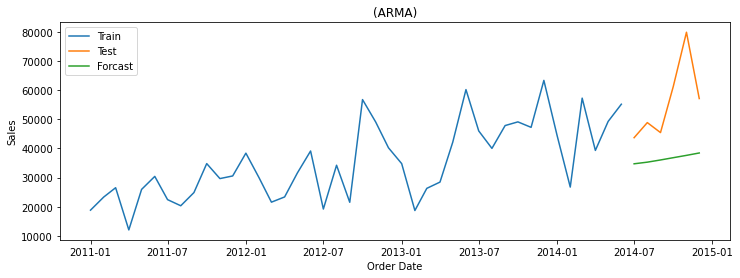

In [123]:
Plot(y_hat_arma['arma_forecast'][test.index.min():],"(ARMA)")

In [124]:
# Calculate RMSE and MAPE

In [125]:
b=Error(y_hat_arma['arma_forecast'][test.index.min():],"Autoregressive moving average (ARMA) method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43
0,Autoregressive (AR) method,10985.28,13.56
0,Moving Average (MA) method,23360.02,33.93
0,Autoregressive moving average (ARMA) method,22654.32,32.40


## Auto regressive integrated moving average (ARIMA)

In [126]:
model = ARIMA(train_data_boxcox, order=(1, 1, 1))# p,d,q
model_fit = model.fit()
print(model_fit.params)

const        0.02147
ar.L1.D.y    0.07458
ma.L1.D.y   -1.00000
dtype: float64


C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [127]:
y_hat_arima = data_boxcox_diff.copy()
y_hat_arima['arima_forecast_boxcox_diff'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_arima['arima_forecast_boxcox'] = y_hat_arima['arima_forecast_boxcox_diff'].cumsum()
y_hat_arima['arima_forecast_boxcox'] = y_hat_arima['arima_forecast_boxcox'].add(data_boxcox[0])
y_hat_arima['arima_forecast'] = np.exp(y_hat_arima['arima_forecast_boxcox'])

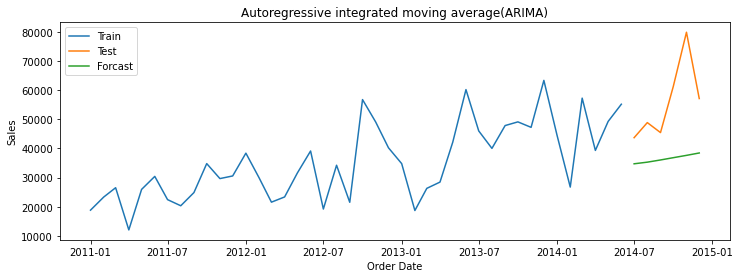

In [128]:
Plot(y_hat_arima['arima_forecast'][test.index.min():],"Autoregressive integrated moving average(ARIMA)")

In [129]:
b=Error(y_hat_arima['arima_forecast'][test.index.min():],"(ARIMA)")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43
0,Autoregressive (AR) method,10985.28,13.56
0,Moving Average (MA) method,23360.02,33.93
0,Autoregressive moving average (ARMA) method,22654.32,32.40


## Seasonal auto regressive integrated moving average (SARIMA)

In [130]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train_data_boxcox, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\sid\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


ar.L1      -0.041622
ma.L1      -0.996737
ar.S.L12    0.099996
ma.S.L12   -0.968194
sigma2      0.058472
dtype: float64


In [131]:
y_hat_sarima = data_boxcox_diff.copy()
y_hat_sarima['sarima_forecast_boxcox'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])

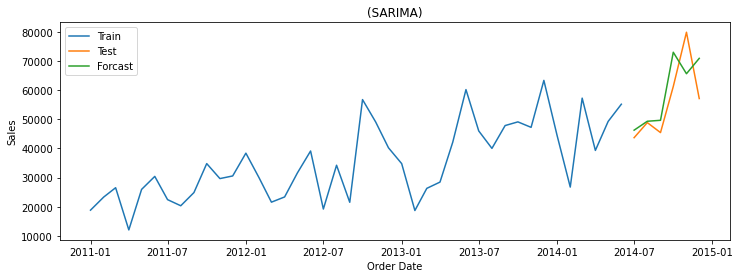

In [132]:
Plot(y_hat_sarima['sarima_forecast'][test.index.min():],"(SARIMA)")

In [133]:
b=Error(y_hat_sarima['sarima_forecast'][test.index.min():],"(SARIMA) Seasonal autoregressive integrated moving average method")
a=pd.concat([a,b])
a

,Method,RMSE,MAPE
0,naive,12355.97,17.47
0,simple average method,24146.06,34.34
0,Simple moving average method,14756.73,15.82
0,Simple Exponential Smoothing,14627.34,15.74
0,Holt's Exponential Smoothing,18976.37,34.57
0,Holt's winter Additive method,9306.82,10.17
0,Holt's winter Multiplicative method,9423.23,11.43
0,Autoregressive (AR) method,10985.28,13.56
0,Moving Average (MA) method,23360.02,33.93
0,Autoregressive moving average (ARMA) method,22654.32,32.40


### Conclusion

##### 1. Holt Winters additive method is the best forecasting method amongs the smoothing technique

##### 2. Seasonal Autoregressive Integrated moving average (SARIMA) is the best forcasting method amongs all ARIMA set of models.